# Approach 2: All classes (except Hidden Road and Hidden Median)

In [8]:
IMG_HEIGHT = 512
IMG_WIDTH = 512
IMG_CHANNELS = 3

In [9]:
import tensorflow as tf
num_classes = 10 # No Hidden Road and Hidden Median and we have to count background

inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

#Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
b1 = tf.keras.layers.BatchNormalization()(c1)
r1 = tf.keras.layers.ReLU()(b1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(r1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
b2 = tf.keras.layers.BatchNormalization()(c2)
r2 = tf.keras.layers.ReLU()(b2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(r2)
 
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
b3 = tf.keras.layers.BatchNormalization()(c3)
r3 = tf.keras.layers.ReLU()(b3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(r3)
 
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
b4 = tf.keras.layers.BatchNormalization()(c4)
r4 = tf.keras.layers.ReLU()(b4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(r4)
 
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
b5 = tf.keras.layers.BatchNormalization()(c5)
r5 = tf.keras.layers.ReLU()(b5)
c5 = tf.keras.layers.Dropout(0.3)(r5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

#Expansive path 
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
u6 = tf.keras.layers.BatchNormalization()(u6)
u6 = tf.keras.layers.ReLU()(u6)

 
u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(u6)
u7 = tf.keras.layers.concatenate([u7, c3])
u7 = tf.keras.layers.BatchNormalization()(u7)
u7 = tf.keras.layers.ReLU()(u7)

 
u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(u7)
u8 = tf.keras.layers.concatenate([u8, c2])
u8 = tf.keras.layers.BatchNormalization()(u8)
u8 = tf.keras.layers.ReLU()(u8)
 
u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(u8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
u9 = tf.keras.layers.BatchNormalization()(u9)
u9 = tf.keras.layers.ReLU()(u9)

outputs = tf.keras.layers.Conv2D(num_classes, (1, 1), activation='sigmoid')(u9)

In [11]:
from my_metrics import iou_loss, dice_dice_loss
model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss=dice_dice_loss, metrics=['accuracy',
                                                              tf.keras.metrics.OneHotIoU(num_classes, [1, 2, 3, 4, 5, 6, 7, 8, 9]),
                                                              tf.keras.metrics.CategoricalAccuracy(),
                                                              tf.keras.metrics.CategoricalCrossentropy(),
                                                              tf.keras.metrics.Precision(),
                                                              tf.keras.metrics.Recall(),
                                                              # tf.keras.metrics.FalseNegatives(),
                                                              # tf.keras.metrics.FalsePositives(),
                                                              # tf.keras.metrics.TruePositives(),
                                                              # tf.keras.metrics.TrueNegatives()
                                                              ])

In [12]:
%load_ext autoreload
%autoreload 2
import tensorflow as tf
import rasterio
import numpy as np
import os
import matplotlib.pyplot as plt
import random
from helpers import show_image_from_np


seed = 42
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)
epochs = 10
DATASET_FRACTION = 0.15

def read_files():
    def _gen():
        tile_directory = '../data/tiles'
        photos_dir = os.path.join(tile_directory, 'photos')
        masks_dir = os.path.join(tile_directory, 'masks')

        photo_files = os.listdir(photos_dir)
        mask_files = os.listdir(masks_dir)
        # number of samples as fraction of the whole dataset
        num_samples = int(len(photo_files) * DATASET_FRACTION)

        photo_files_subset = photo_files[:num_samples]
        mask_files_subset = mask_files[:num_samples]

        for photo_path, mask_path in zip(photo_files_subset, mask_files_subset):
            with rasterio.open(os.path.join(photos_dir, photo_path)) as photo_ds:
                photo = np.transpose(photo_ds.read([1, 2, 3]), (1, 2, 0))

            with rasterio.open(os.path.join(masks_dir, mask_path)) as mask_ds:
                mask = mask_ds.read(1)
                mask = mask.astype('int32')

            yield photo, mask
    return _gen


def preprocess_image(photo, mask):
    # in this case we do one-hot encoding
    photo = tf.image.resize(photo, [512, 512])

    mask = tf.expand_dims(mask, axis=-1)
    mask = tf.image.resize(mask, [512, 512])
    mask = tf.cast(mask, tf.int32)
    mask = tf.where(mask==5, 4, mask)  # Set Intersection to Road
    mask = tf.where(mask==10, 0, mask)  # Remove Hidden Median
    mask = tf.where(mask==11, 0, mask)  # Remove Hidden Road

    mask = tf.squeeze(tf.one_hot(mask, num_classes, axis=-1), axis=2)
    mask = tf.cast(mask, tf.int32)
    print(mask)

    return photo, mask

def skip_condition(photo, mask):
    # Skip samples that are have labels greater than 10 or no labels at all
    max_value = tf.reduce_max(mask)
    less = tf.less(max_value, 11)
    greater = tf.greater(max_value, 0)
    return tf.logical_and(less, greater)

def normalize_input(photo, mask):
    photo = tf.cast(photo, tf.float32)
    photo = photo/255.
    return photo, mask


output_signature = (
    tf.TensorSpec(shape=(2048, 2048, 3), dtype=tf.int32),
    tf.TensorSpec(shape=(2048, 2048), dtype=tf.int32)
)

dataset = tf.data.Dataset.from_generator(read_files(), output_signature=output_signature)
dataset = dataset.shuffle(buffer_size=10)
dataset = dataset.map(preprocess_image)
dataset = dataset.filter(skip_condition)
dataset = dataset.map(normalize_input)

total_samples = dataset.reduce(np.int32(0), lambda x, _: x + 1).numpy()
print(total_samples)
train_samples = int(total_samples * 0.7)
test_samples = int(total_samples * 0.2)
val_samples = int(total_samples * 0.1)

train_dataset = dataset.take(train_samples)
test_dataset = dataset.skip(train_samples).take(test_samples)
val_dataset = dataset.skip(train_samples).skip(test_samples).take(val_samples)

train_dataset = train_dataset.batch(4)
train_dataset = train_dataset.repeat(epochs)

test_dataset = test_dataset.batch(1)
val_dataset = val_dataset.repeat(epochs)
val_dataset = val_dataset.batch(4)

hist = model.fit(train_dataset, validation_data=val_dataset, epochs=epochs)

Tensor("Cast_1:0", shape=(512, 512, 10), dtype=int32)
59
Epoch 1/10
110/110 [==============================] - 299s 3s/step - loss: 0.3860 - accuracy: 0.7681 - one_hot_io_u_2: 0.0146 - categorical_accuracy: 0.7681 - categorical_crossentropy: 1.0449 - precision: 0.5124 - recall: 0.8704 - false_negatives: 13927530.0000 - false_positives: 89014192.0000 - true_positives: 93551488.0000 - true_negatives: 878297216.0000 - val_loss: 0.2096 - val_accuracy: 0.8350 - val_one_hot_io_u_2: 0.0000e+00 - val_categorical_accuracy: 0.8350 - val_categorical_crossentropy: 0.9123 - val_precision: 0.8350 - val_recall: 0.8350 - val_false_negatives: 2162045.0000 - val_false_positives: 2162197.0000 - val_true_positives: 10945155.0000 - val_true_negatives: 115802616.0000
Epoch 2/10
110/110 [==============================] - 281s 3s/step - loss: 0.1177 - accuracy: 0.9016 - one_hot_io_u_2: 0.0451 - categorical_accuracy: 0.9016 - categorical_crossentropy: 0.4114 - precision: 0.9146 - recall: 0.8859 - false_negativ

In [13]:
model.save('./models/all_1p.h5')

In [14]:
import pickle

with open('history_all_1p.pickle', 'wb') as handle:
    pickle.dump(hist.history, handle, protocol=pickle.HIGHEST_PROTOCOL)

# Evaluate

In [18]:
import tensorflow as tf
from my_metrics import dice_dice_loss
model = tf.keras.models.load_model('./models/all_1p.h5', custom_objects={'dice_dice_loss': dice_dice_loss})

In [87]:
import rasterio
import numpy as np
import os
from helpers import show_image_from_np

seed = 42
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)
epochs = 10
DATASET_FRACTION = 0.15

def read_files():
    def _gen():
        tile_directory = '../data/tiles'
        photos_dir = os.path.join(tile_directory, 'photos')
        masks_dir = os.path.join(tile_directory, 'masks')

        photo_files = os.listdir(photos_dir)
        mask_files = os.listdir(masks_dir)
        # number of samples as fraction of the whole dataset
        num_samples = int(len(photo_files) * DATASET_FRACTION)

        photo_files_subset = photo_files[:num_samples]
        mask_files_subset = mask_files[:num_samples]

        for photo_path, mask_path in zip(photo_files_subset, mask_files_subset):
            with rasterio.open(os.path.join(photos_dir, photo_path)) as photo_ds:
                photo = np.transpose(photo_ds.read([1, 2, 3]), (1, 2, 0))

            with rasterio.open(os.path.join(masks_dir, mask_path)) as mask_ds:
                mask = mask_ds.read(1)
                mask = mask.astype('int32')

            yield photo, mask
    return _gen


def preprocess_image(photo, mask):
    photo = tf.image.resize(photo, [512, 512])

    mask = tf.expand_dims(mask, axis=-1)
    mask = tf.image.resize(mask, [512, 512])
    mask = tf.cast(mask, tf.int32)
    mask = tf.where(mask==5, 4, mask)  # Set Intersection to Road
    mask = tf.where(mask==10, 0, mask)  # Remove Hidden Median
    mask = tf.where(mask==11, 0, mask)  # Remove Hidden Road


    return photo, mask

def skip_condition(photo, mask):
    # Skip samples that are have labels greater than 10 or no labels at all
    max_value = tf.reduce_max(mask)
    less = tf.less(max_value, 11)
    greater = tf.greater(max_value, 0)
    return tf.logical_and(less, greater)

def normalize_input(photo, mask):
    photo = tf.cast(photo, tf.float32)
    photo = photo/255.
    return photo, mask


output_signature = (
    tf.TensorSpec(shape=(2048, 2048, 3), dtype=tf.int32),
    tf.TensorSpec(shape=(2048, 2048), dtype=tf.int32)
)

print('Accessing Dataset...')
dataset = tf.data.Dataset.from_generator(read_files(), output_signature=output_signature)
dataset = dataset.shuffle(buffer_size=10)
dataset = dataset.map(preprocess_image)
dataset = dataset.filter(skip_condition)
dataset = dataset.map(normalize_input)

total_samples = dataset.reduce(np.int32(0), lambda x, _: x + 1).numpy()
print(total_samples)
train_samples = int(total_samples * 0.7)
test_samples = int(total_samples * 0.2)
val_samples = int(total_samples * 0.1)

print('Splitting Data')
train_dataset = dataset.take(train_samples)
test_dataset = dataset.skip(train_samples).take(test_samples)
val_dataset = dataset.skip(train_samples).skip(test_samples).take(val_samples)

test_dataset = test_dataset.batch(1)


Accessing Dataset...
59
Splitting Data


In [88]:
preds = model.predict(test_dataset)

11/11 [==============================] - 18s 248ms/step


In [89]:
# newmasks = np.where(preds>0.5, 1, 0)
newmasks = np.argmax(preds, axis=3)


In [90]:
# testdata = test_dataset.take(len(newmasks))

In [91]:
unbatched = [(x.numpy()*255,y.numpy()) for x, y in test_dataset.unbatch()]

In [92]:
unbatched[1][1].shape

(512, 512, 1)

In [93]:
newmasks[0]


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

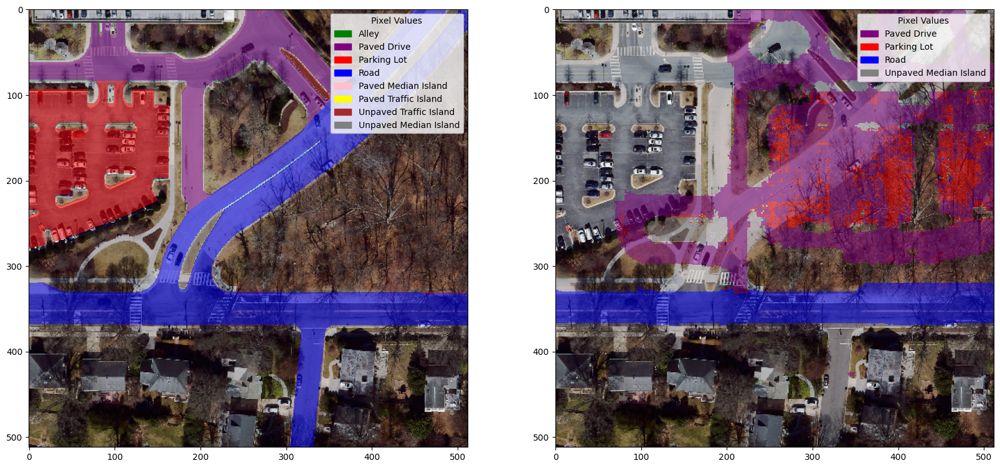

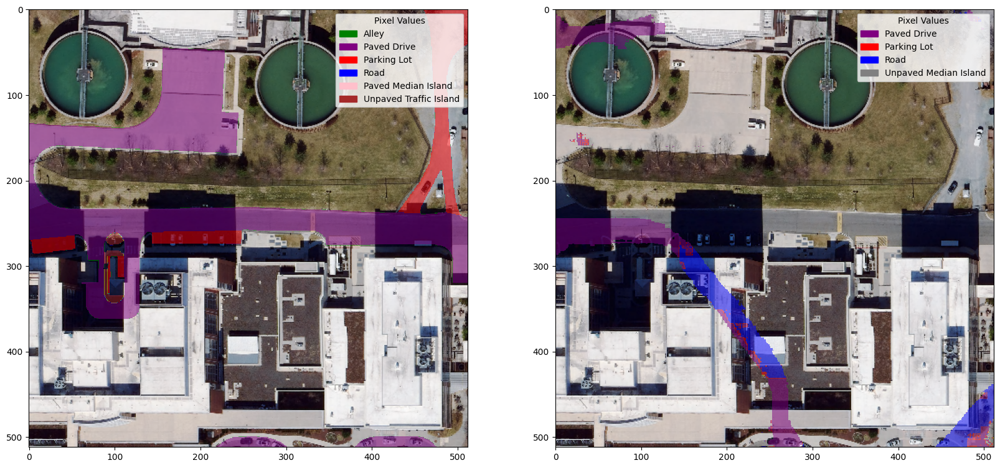

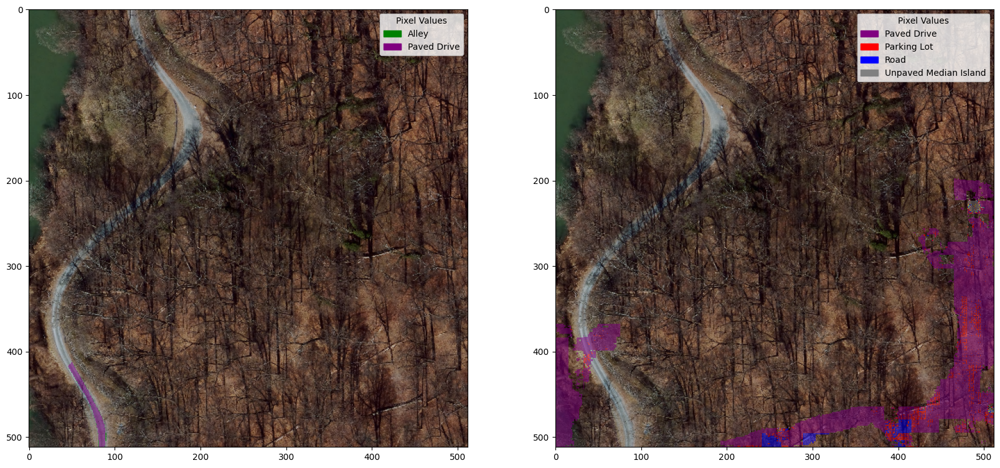

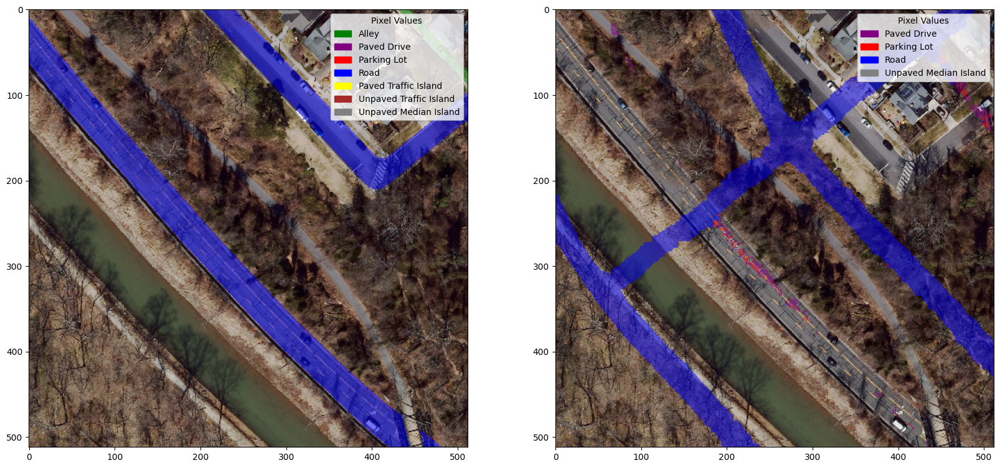

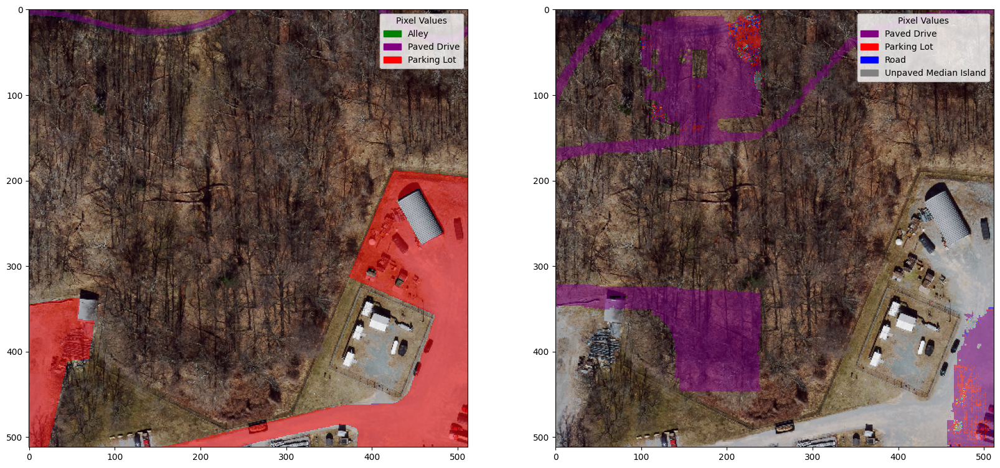

...

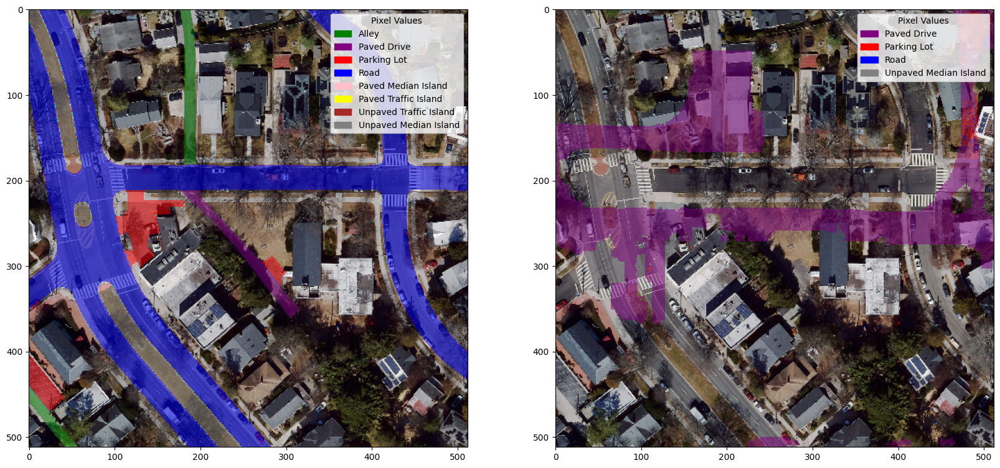

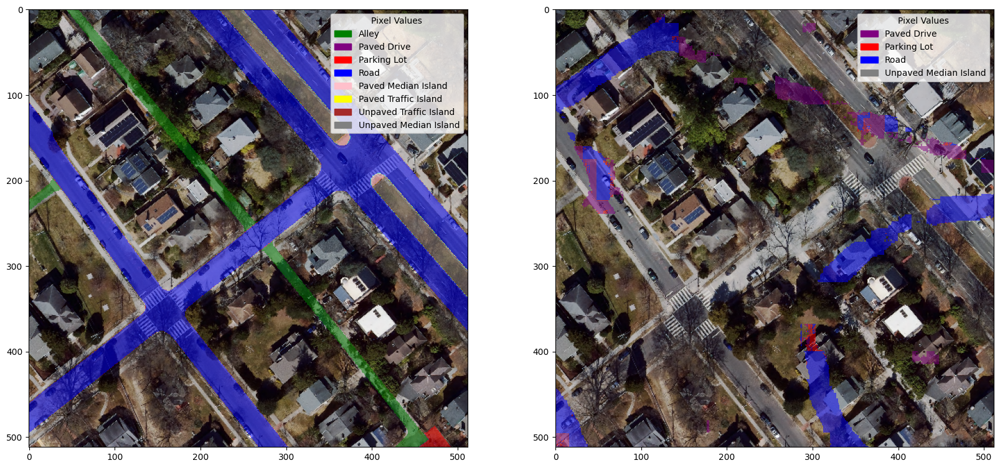

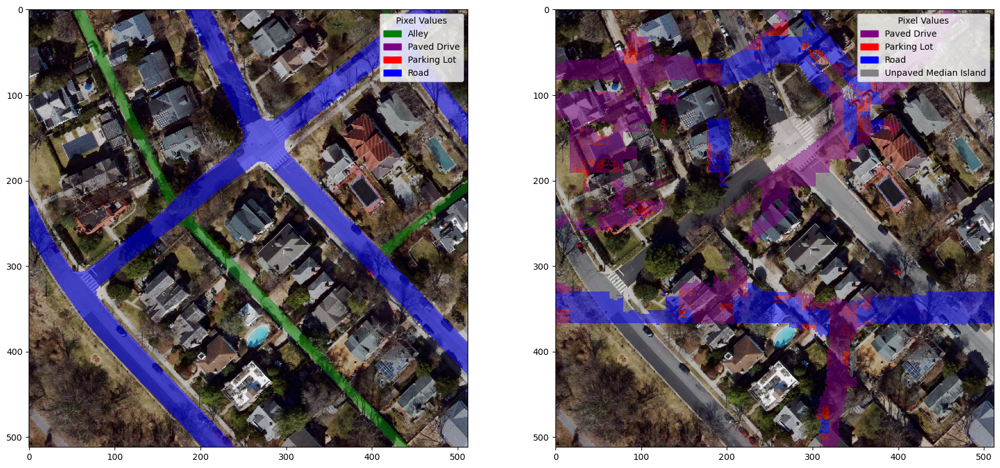

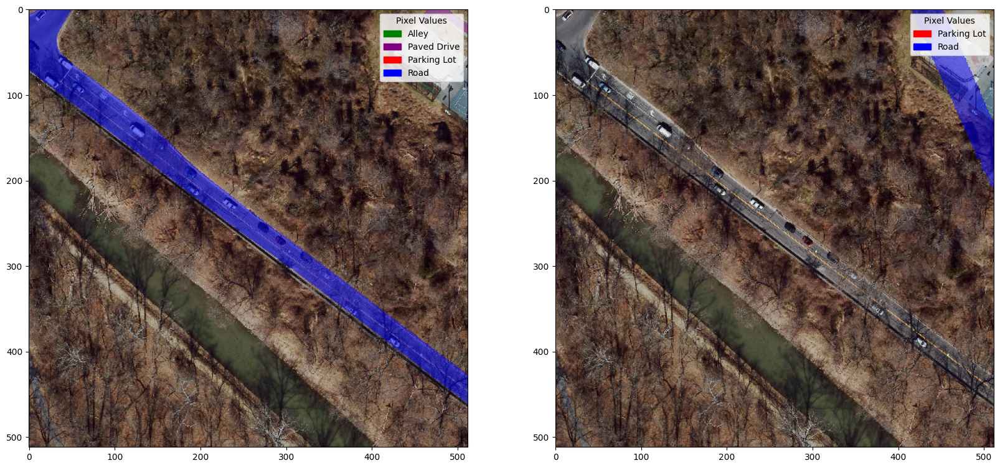

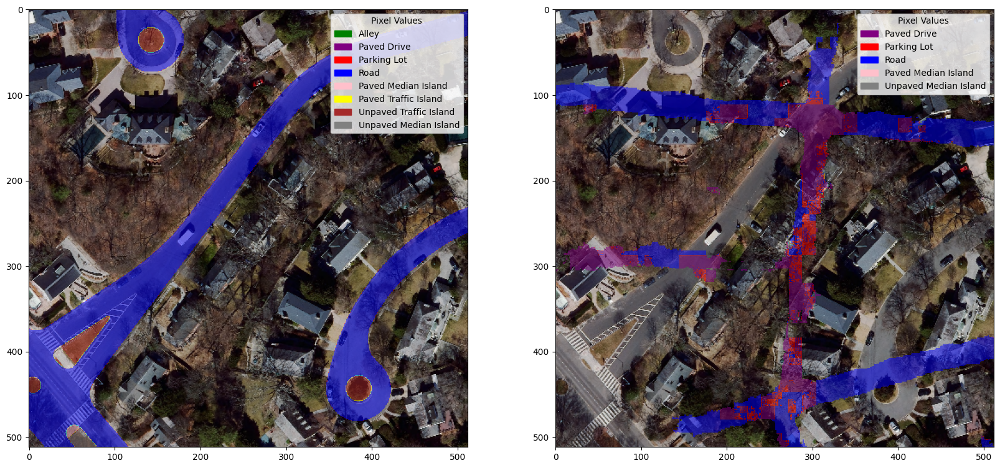

In [94]:
from helpers import compare_predicted_mask
for (photo, mask), pred in zip(unbatched[:], newmasks):
    compare_predicted_mask(photo, mask, pred)
